Размер: (928, 1138)


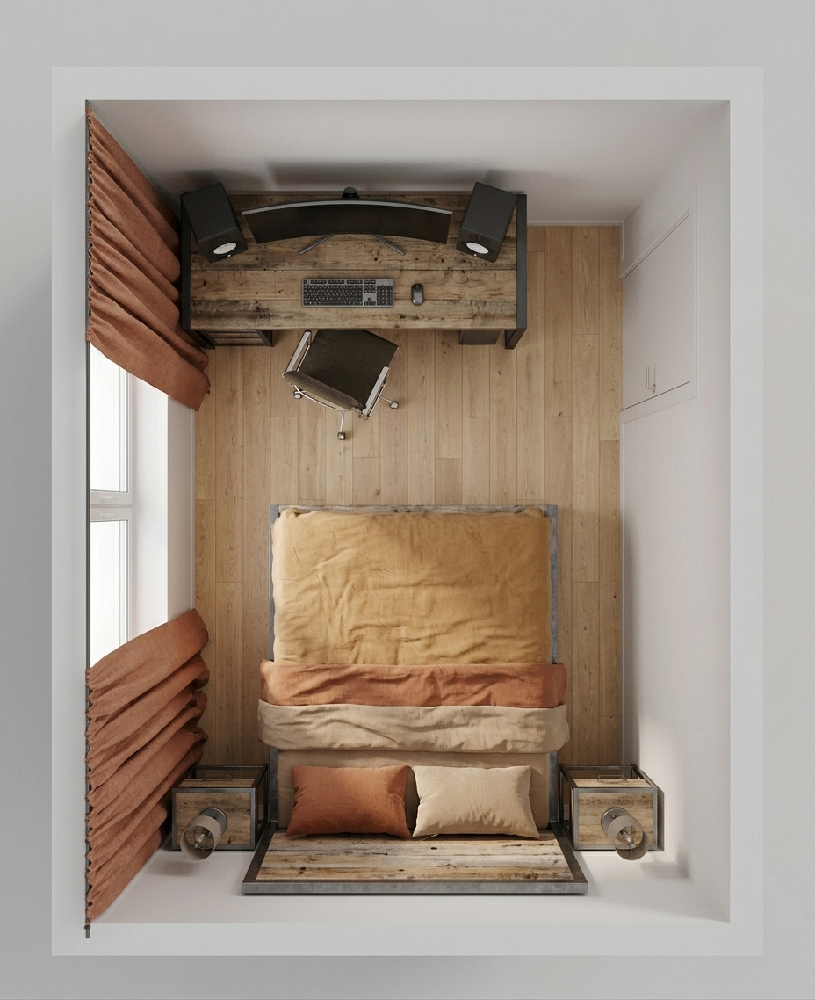

In [30]:
from PIL import Image                                                                                                                                  
                                                                                                                                                         
def load_image(path: str) -> Image.Image:                                                                                                              
    """Загружает изображение по пути."""                                                                                                               
    img = Image.open(path)                                                                                                                             
    print(f"Размер: {img.size}")                                                                                                                       
    return img                                                                                                                                         
                                                                                                                                                        
img = load_image("/Users/mask/Documents/Проекты_2026/FSK_generate_image/results/a2c74886/references/Спальня.png")                                      
img

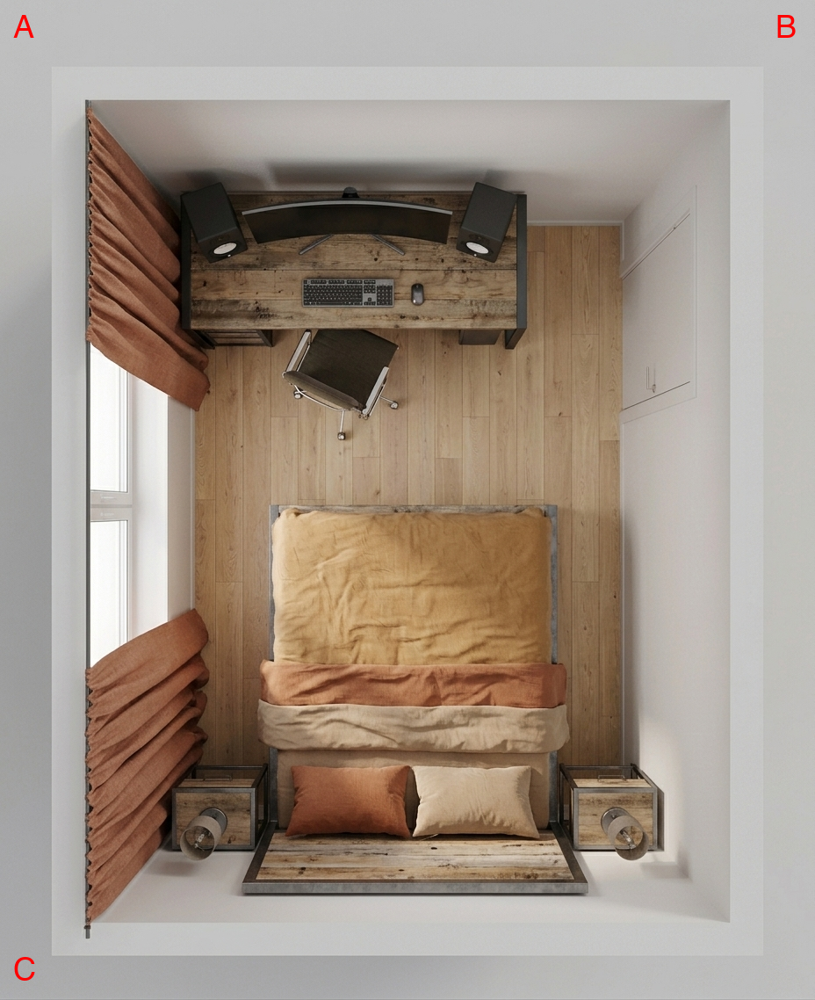

In [33]:
from PIL import ImageDraw, ImageFont

def add_corner_labels(img: Image.Image) -> Image.Image:
    """Ставит метки A, B, C в углы изображения."""
    marked = img.copy().convert("RGBA")
    draw = ImageDraw.Draw(marked)
    w, h = marked.size

    try:
        font = ImageFont.truetype("/System/Library/Fonts/Helvetica.ttc", 36)
    except:
        font = ImageFont.load_default()

    margin = 15
    draw.text((margin, margin), "A", fill="red", font=font)
    draw.text((w - margin - 30, margin), "B", fill="red", font=font)
    draw.text((margin, h - margin - 36), "C", fill="red", font=font)

    return marked

labeled = add_corner_labels(img)
labeled

Размер: (1452, 1468)


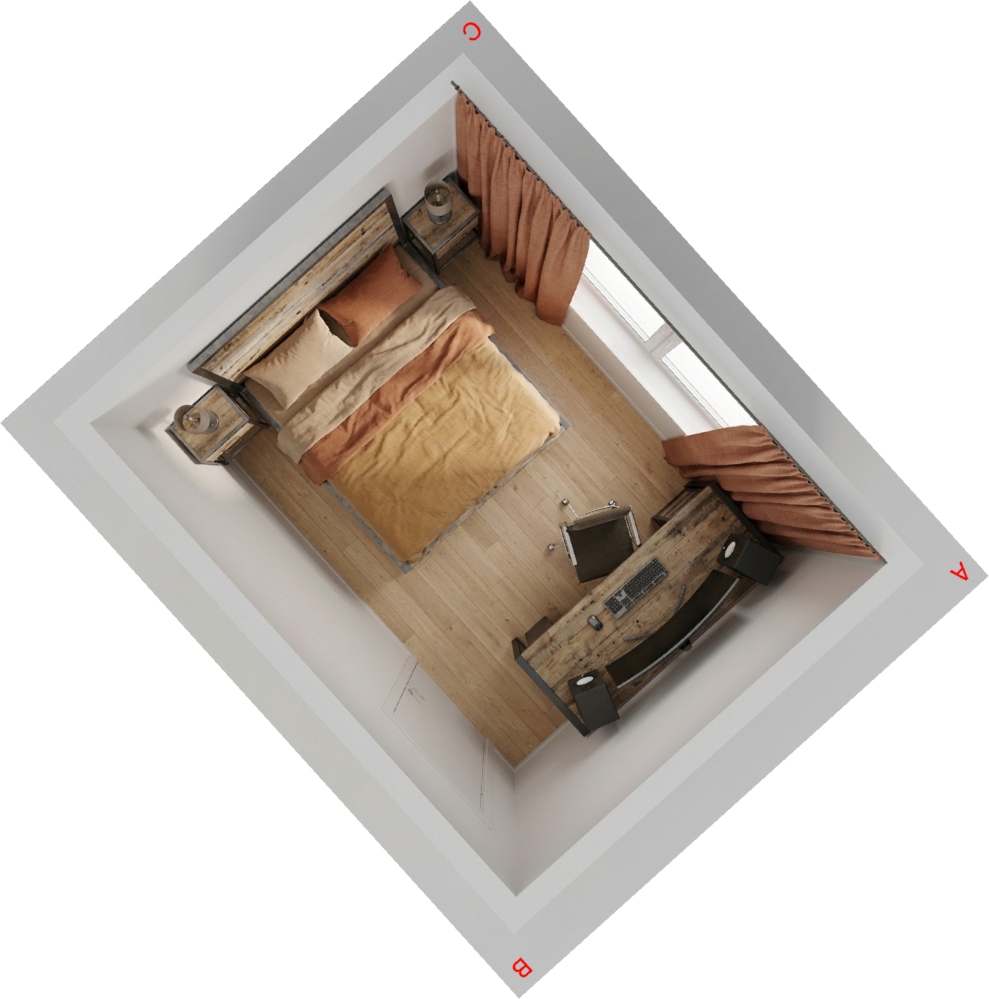

In [50]:
from PIL import ImageDraw, ImageFont

def rotate_image(img: Image.Image, angle: int = 222) -> Image.Image: # 222 и 30 пока норм                                                                               
    """Поворачивает изображение на заданный угол."""                                                                                                   
    return img.rotate(angle, expand=True)                                                                                                              
                                                                                                                                                        
rotated_222 = rotate_image(labeled)                                                                                                                         
print(f"Размер: {rotated_222.size}")                                                                                                                       
rotated_222

Размер: (1374, 1450)


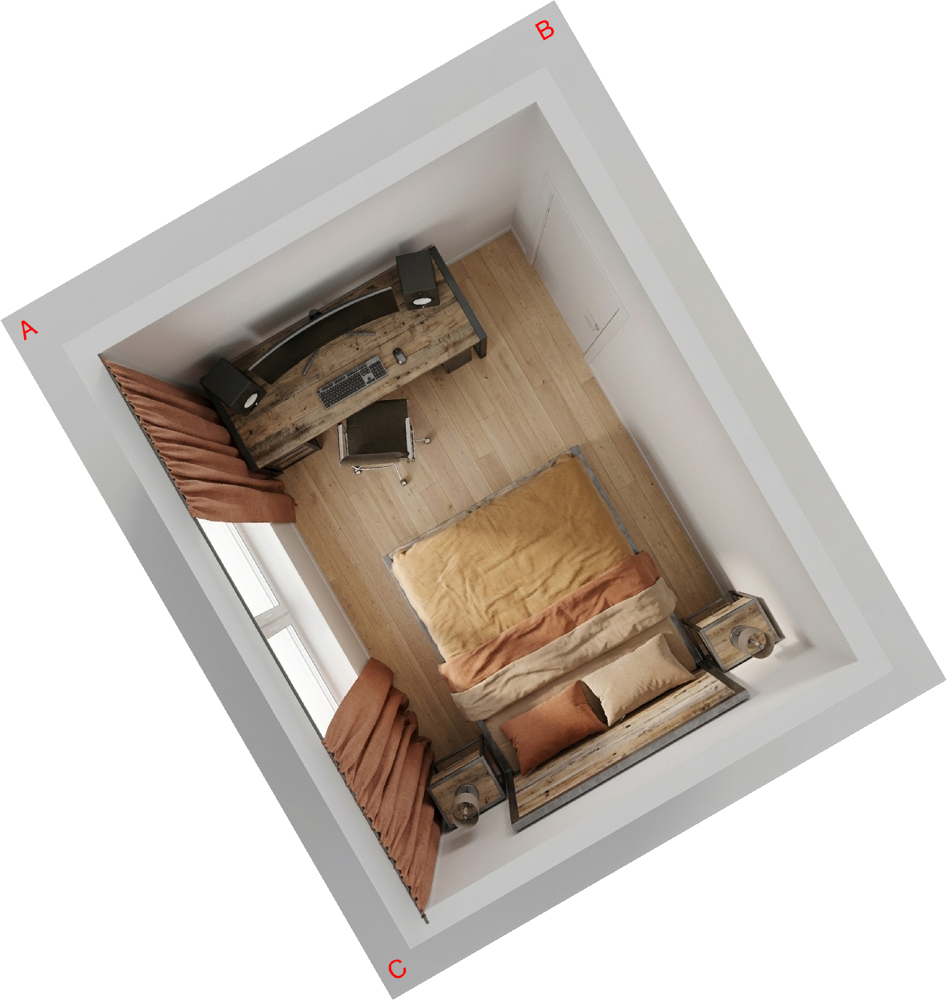

In [49]:
from PIL import ImageDraw, ImageFont

def rotate_image(img: Image.Image, angle: int = 30) -> Image.Image: # 222 и 30 пока норм                                                                               
    """Поворачивает изображение на заданный угол."""                                                                                                   
    return img.rotate(angle, expand=True)                                                                                                              
                                                                                                                                                        
rotated_30 = rotate_image(labeled)                                                                                                                         
print(f"Размер: {rotated_30.size}")                                                                                                                       
rotated_30

2026-04-01 08:34:36 | INFO  | fsk.osmi | [notebook_render] Запрос к OSMI (попытка 1/3)
2026-04-01 08:35:00 | INFO  | fsk.osmi | [notebook_render] Ответ OSMI: 924995 символов
2026-04-01 08:35:00 | INFO  | fsk.osmi | [notebook_render] Изображение: 903 KB


Результат: (1376, 768)


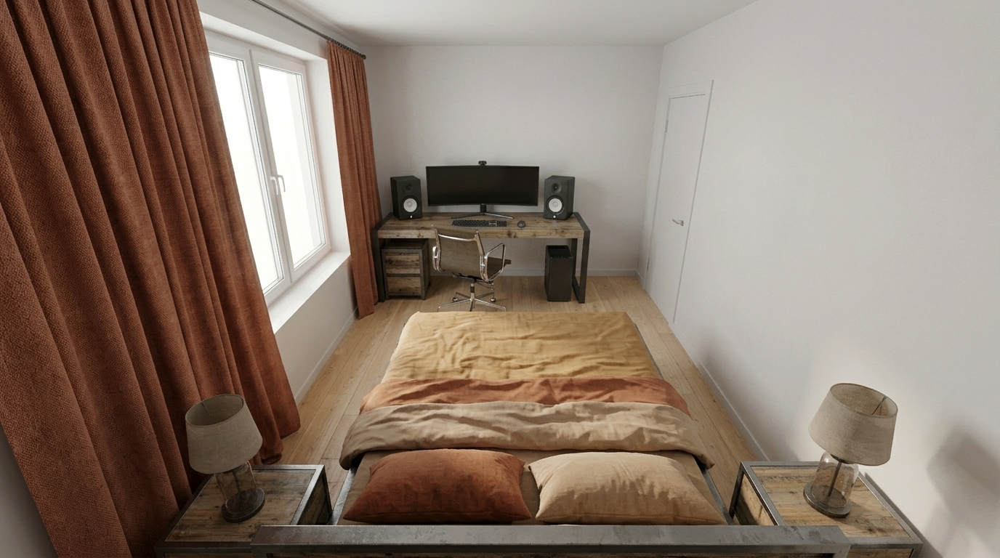

In [51]:
import sys
sys.path.insert(0, "/Users/mask/Documents/Проекты_2026/FSK_generate_image")

import base64
import io
from src.osmi_client import call_osmi_image

RENDER_PROMPT = """На изображении — часть интерьера комнаты (вид сверху).  нижний угол, верхний угол.

Сгенерируй фото этой помещения смотря нижний угол --> в верхний угол. на уровне глаз — как будто ты стоишь в углу нижнем и фотографируешь верний угол.

Правила:
- ВСЯ область от нижнего угда до верхнего должна ПОЛНОСТЬЮ поместиться в кадр
- УЧИТЫВАЙ ГЕОМЕТРИЮ комнаты и ГЕОМЕТРИЮ пропорции мебели и артефактов со схемы — не искажай размеры и форму
- Мебель и ВСЕ артефакты строго как на референсе, без добавлений и выдумок
- Не добавляй ничего нового — только то что видно на изображении
- Фотореализм, горизонтальный кадр на уровне глаз
- Без текста, надписей, водяных знаков, без букв-якорей"""

def render_side_from_ref(img: Image.Image, prompt: str = RENDER_PROMPT) -> Image.Image:
    """Отправляет подготовленное изображение в OSMI и получает горизонтальное фото."""
    buf = io.BytesIO()
    img_rgb = img.convert("RGB") if img.mode == "RGBA" else img
    img_rgb.save(buf, format="PNG")
    img_b64 = base64.b64encode(buf.getvalue()).decode("utf-8")

    result_b64 = call_osmi_image(prompt, img_b64, context="notebook_render")

    img_bytes = base64.b64decode(result_b64)
    return Image.open(io.BytesIO(img_bytes))

result = render_side_from_ref(rotated_30)
print(f"Результат: {result.size}")
result

2026-03-31 16:19:42 | INFO  | fsk.osmi | [notebook_render] Запрос к OSMI (попытка 1/3)
2026-03-31 16:20:09 | INFO  | fsk.osmi | [notebook_render] Ответ OSMI: 860431 символов
2026-03-31 16:20:09 | INFO  | fsk.osmi | [notebook_render] Изображение: 840 KB


Результат: (1376, 768)


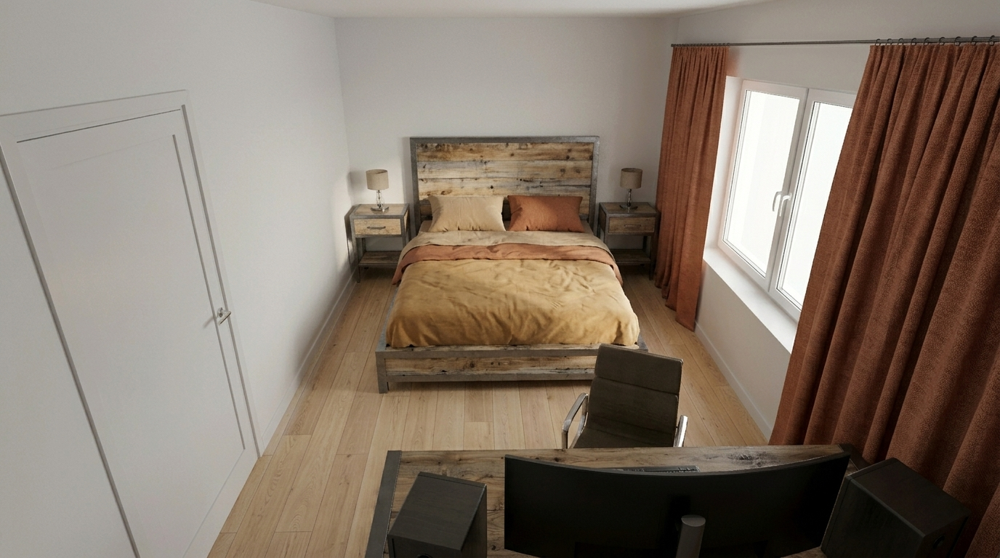

In [ ]:
import sys
sys.path.insert(0, "/Users/mask/Documents/Проекты_2026/FSK_generate_image")

import base64
import io
from src.osmi_client import call_osmi_image

RENDER_PROMPT = """На изображении — часть интерьера комнаты (вид сверху).  нижний угол, верхний угол.

Сгенерируй фото этой помещения смотря нижний угол --> в верхний угол. на уровне глаз — как будто ты стоишь в углу нижнем и фотографируешь верний угол.

Правила:
- ВСЯ область от нижнего угда до верхнего должна ПОЛНОСТЬЮ поместиться в кадр
- УЧИТЫВАЙ ГЕОМЕТРИЮ комнаты и ГЕОМЕТРИЮ пропорции мебели и артефактов со схемы — не искажай размеры и форму
- Мебель и ВСЕ артефакты строго как на референсе, без добавлений и выдумок
- Не добавляй ничего нового — только то что видно на изображении
- Фотореализм, горизонтальный кадр на уровне глаз
- Без текста, надписей, водяных знаков, без букв-якорей"""

def render_side_from_ref(img: Image.Image, prompt: str = RENDER_PROMPT) -> Image.Image:
    """Отправляет подготовленное изображение в OSMI и получает горизонтальное фото."""
    buf = io.BytesIO()
    img_rgb = img.convert("RGB") if img.mode == "RGBA" else img
    img_rgb.save(buf, format="PNG")
    img_b64 = base64.b64encode(buf.getvalue()).decode("utf-8")

    result_b64 = call_osmi_image(prompt, img_b64, context="notebook_render")

    img_bytes = base64.b64decode(result_b64)
    return Image.open(io.BytesIO(img_bytes))

result = render_side_from_ref(rotated)
print(f"Результат: {result.size}")
result